In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

2022-12-12 00:17:30.874418: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
DATA_PATH = os.path.join("./data")
NO_SEQUENCES = 500
NO_SEQUENCES_LETTERS = 700
LENGTH_SEQUENCES = 30

In [3]:
actions = np.array([i for i in sorted(os.listdir("./data")) if i != ".DS_Store"])

In [4]:
label_map = {label: num for num, label in enumerate(actions)}
label_map

{'Danke': 0,
 'Ende': 1,
 'Gut(en)': 2,
 'Morgen': 3,
 'Name': 4,
 'Stop': 5,
 'Termin': 6,
 'a': 7,
 'brauche': 8,
 'd': 9,
 'e': 10,
 'i': 11,
 'ich': 12,
 'l': 13,
 'mein': 14,
 'n': 15}

In [5]:
label_map_reverse = {value: key for key, value in label_map.items()}

In [6]:
label_map_reverse

{0: 'Danke',
 1: 'Ende',
 2: 'Gut(en)',
 3: 'Morgen',
 4: 'Name',
 5: 'Stop',
 6: 'Termin',
 7: 'a',
 8: 'brauche',
 9: 'd',
 10: 'e',
 11: 'i',
 12: 'ich',
 13: 'l',
 14: 'mein',
 15: 'n'}

In [7]:
letters = ["d", "a", "n", "i", "e", "l"]

sequences = []
labels = []

for action in label_map.keys():
    if not action in letters:
        for sequence in range(NO_SEQUENCES):
            window_1 = []
            for frame_num in range(LENGTH_SEQUENCES):
                res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)), allow_pickle=True)
                window_1.append(res[0])
                print(f"{action}")
                print(f"{res[0].shape}, 1")
            sequences.append(window_1)
            labels.append(label_map[action])
    else:
        for sequence in range(NO_SEQUENCES_LETTERS):
            window_1 = []
            for frame_num in range(LENGTH_SEQUENCES):
                res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)), allow_pickle=True)
                window_1.append(res[0])
                print(f"{action}")
                print(f"{res[0].shape}, 2")
            sequences.append(window_1)
            labels.append(label_map[action])

Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(172,), 1
Danke
(1

In [8]:
X = np.array(sequences)

In [9]:
X.shape

(9200, 30, 172)

In [10]:
y = np.array(labels)

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [12]:
X_train.shape, y_train.shape

((7820, 30, 172), (7820,))

In [13]:
X_test.shape, y_test.shape

((1380, 30, 172), (1380,))

In [14]:
ytest_true = y_test.copy()

In [15]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [16]:
from tensorflow import keras
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.callbacks import TensorBoard
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score

In [17]:
opt = keras.optimizers.Adam(learning_rate=0.0001)

2022-12-12 00:28:28.416258: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [21]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir=log_dir)

In [18]:
callback = keras.callbacks.EarlyStopping(monitor='categorical_accuracy', patience=25)

In [19]:
model = Sequential()
model.add(LSTM(128, return_sequences=True, activation='relu', input_shape=(30, 172)))
model.add(LSTM(256, return_sequences=True, activation='relu'))
model.add(LSTM(128, return_sequences=False, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(actions.shape[0], activation='softmax'))

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 30, 128)           154112    
                                                                 
 lstm_1 (LSTM)               (None, 30, 256)           394240    
                                                                 
 lstm_2 (LSTM)               (None, 128)               197120    
                                                                 
 dense (Dense)               (None, 128)               16512     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 16)                1040      
                                                                 
Total params: 771,280
Trainable params: 771,280
Non-trai

In [21]:
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [22]:
history = model.fit(X_train, y_train, epochs=1000, validation_split=0.2, callbacks=[callback])

Epoch 1/1000
196/196 [==============================] - 35s 150ms/step - loss: 1.9911 - categorical_accuracy: 0.3274 - val_loss: 1.1587 - val_categorical_accuracy: 0.6145
Epoch 2/1000
196/196 [==============================] - 28s 141ms/step - loss: 0.8246 - categorical_accuracy: 0.6998 - val_loss: 0.6095 - val_categorical_accuracy: 0.7922
Epoch 3/1000
196/196 [==============================] - 25s 129ms/step - loss: 0.5102 - categorical_accuracy: 0.8099 - val_loss: 0.5623 - val_categorical_accuracy: 0.8037
Epoch 4/1000
196/196 [==============================] - 25s 126ms/step - loss: 0.3823 - categorical_accuracy: 0.8590 - val_loss: 0.2109 - val_categorical_accuracy: 0.9444
Epoch 5/1000
196/196 [==============================] - 24s 124ms/step - loss: 0.2749 - categorical_accuracy: 0.9051 - val_loss: 0.2868 - val_categorical_accuracy: 0.9130
Epoch 6/1000
196/196 [==============================] - 26s 131ms/step - loss: 0.1964 - categorical_accuracy: 0.9354 - val_loss: 0.2521 - val_cat

In [23]:
# Plot accuracy curve
history.history.keys()

dict_keys(['loss', 'categorical_accuracy', 'val_loss', 'val_categorical_accuracy'])

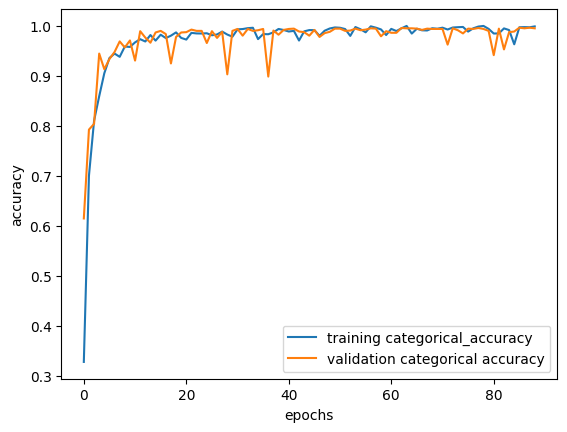

In [24]:
plt.plot(history.history['categorical_accuracy'], label='training categorical_accuracy')
plt.plot(history.history['val_categorical_accuracy'], label= 'validation categorical accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

In [25]:
y_pred = model.predict(X_test)

44/44 [==============================] - 3s 54ms/step


In [26]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
import matplotlib.pyplot as plt

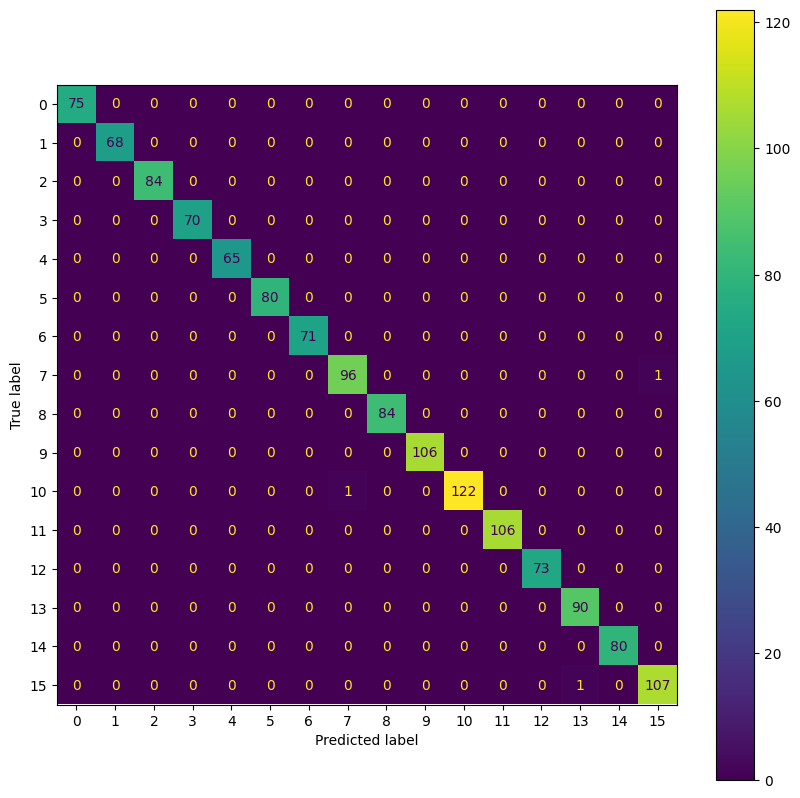

In [27]:
# Plot confusion matrix
cm = confusion_matrix(y_true=ytest_true, y_pred=np.argmax(y_pred, axis=1))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=np.unique(ytest_true))
fig, ax = plt.subplots(figsize=(10,10))

disp.plot(ax=ax)

In [28]:
model.save('./files/1212_model')

INFO:tensorflow:Assets written to: ./files/1212_model/assets


INFO:tensorflow:Assets written to: ./files/1212_model/assets


In [29]:
import pickle

In [30]:
with open('./files/label_map_reverse.bin', 'wb') as f:
    pickle.dump(label_map_reverse, f)